<b> MIS 382N: ADVANCED MACHINE LEARNING<b>

Assignment 2

Total points: 70

Due: Friday, September 23 to be submitted via Canvas by 11:59 pm

Your homework should be written in a python notebook. If you prefer, you can work in groups of two. **Please note that only one student per team needs to submit the assignment on Canvas but make sure to include both students' names and UT EIDs.**

For any question that requires a handwritten solution, you may upload scanned images of your solution in the notebook or attach them to the assignment . You may write your solution using markdown as well.

Please make sure your code runs and the graphs and figures are displayed in your notebook before submitting. (%matplotlib inline)

## Team Member Names

- Sai Bhargav Tetali (srt2578)
- Soumith Palreddy (sp52466)

# Question 1: Bias and Variance (10 pts)

(a). (4 pts) Describe the difference between model bias and the bias of a point estimator. 

(b) (6 pts). How can you use a learning curve to determine whether a model is overfitting  (for a given sample size)? Discuss this with respect to the observed train and validation error curves. How does your answer change if the model you are trying to determine if the model is underfitting?

# Answer : 

## Part a

The model bias is the inability of a Machine Learning model to output the signal part of a dataset. Due to bias, irrespective of the dataset the Machine Learning model will keep giving the same output and high training error. 

The bias of a point estimator is the difference between the value of a parameter, in a predetermined model, obtained from the Maximum Likelihood estimator based on the given dataset and the expected value of the parameter. Ideally, a maximum likelihood estimator is considered unbiased if the said difference is 0.

## Part b

In the case of overfitting there will be huge difference between training and validation errors as the data is varied from training data. There will be huge variance in the model. The difference between training and validation errors will be significant on the learning curve as the training error reaches a stagnant minimum but the validation error keeps increasing as shown in the graph below.

In the case of underfitting the training error itself will be high due to the bias in the model. The model fails to extract the signal in the data. This can be seen in the training data learning curve where the training error does not reduce with time as shown in the below graph.

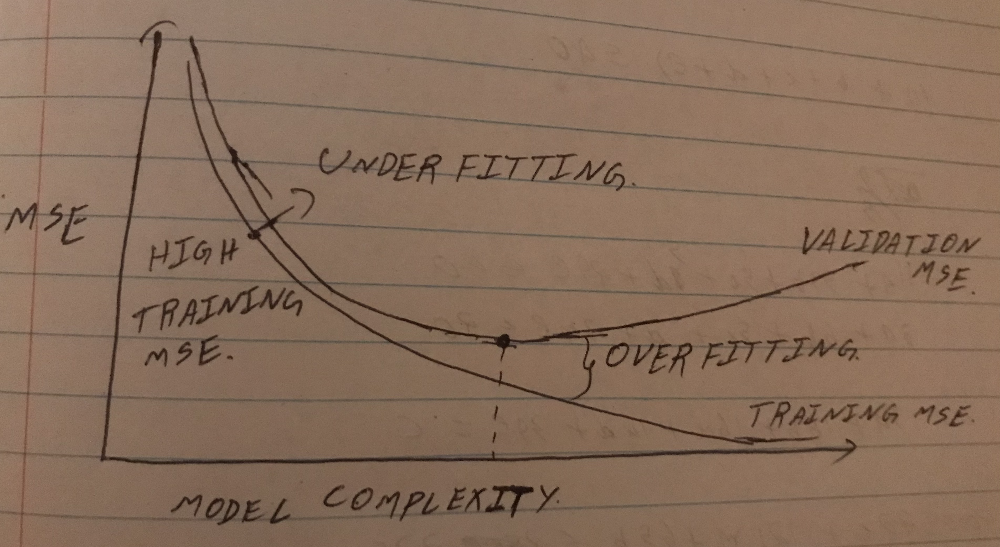

# Question 2: Bias-Variance Exploration (20 pts)
We want to build a model that can predict y for unknown inputs x.

(a) (10 pts) Fit polynomial models of degrees 2, 4, 7 to the training data. Print out the mean squared error (on both train and test sets) for all the models. Plot the data (y_train vs x_train and y_test vs x_test), the fitted models (predictions on x_all by different models vs x_all), and the predictions on the test set (predictions on x_test by different models vs x_test). All the plots must be in the same figure and be clearly labeled. Tips: you can use np.vander(np.squeeze(x_train), deg+1) to generate the deg-degree polynomial vector of x_train. For example, np.vander(np.squeeze(x_train), 3) gives you the second-degree polynomial of x_train.

(b) (5 pts) Which model gives the best performance? Explain in terms of the bias-variance tradeoff.

(c) (5 pts) Analyse how the training data size affects the bias and the variance of the models. For this, run the analysis in (a) using 20, 40, 60, 80 and all 100 data points. Make a single plot of the  𝑙𝑜𝑔(𝑀𝑆𝐸)  for both the training and the test data vs the size of the training set for each of the polynomials. State the trends you see as you change the size of the training data on each of the models and explain why you see them. You can use the following codes to load the dataset and complete the analysis:

In [1]:
from sklearn import linear_model as lm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import numpy as np
from math import log
%matplotlib inline

In [2]:
# Only use this code block if you are using Google Colab.
# If you are using Jupyter Notebook, please ignore this code block. You can directly upload the file to your Jupyter Notebook file systems.
#from google.colab import files

## It will prompt you to select a local file. Click on “Choose Files” then select and upload the file. 
## Wait for the file to be 100% uploaded. You should see the name of the file once Colab has uploaded it.
#uploaded = files.upload()

In [3]:
data_load = np.load('./data.npy', allow_pickle = True)

In [4]:
x_train = data_load.item().get("Xtrain")
y_train = data_load.item().get("Ytrain")
x_test = data_load.item().get("Xtest")
y_test =data_load.item().get("Ytest")
x_all = np.linspace(-10,10,101).reshape(-1,1)

lrp = LinearRegression()
# order = np.argsort(x_train)
# x_train = np.array(x_train)[order]
# y_train = np.array(y_train)[order]

# order = np.argsort(x_test)
# x_test = np.array(x_test)[order]
# y_test = np.array(y_test)[order]

In [5]:
def plot_curves(x_train, y_train, x_test, y_test):
  # Fit polynomial models of degrees 2, 4, 7 to the training data. 
  # Print out the mean squared error (on both train and test sets) for all the models. 
  # Plot the data (y_train vs x_train and y_test vs x_test), the fitted models (predictions on x_all by different models vs x_all), and the predictions on the test set (predictions on x_test by different models vs x_test). 
    power_list = [2,4,7]
    train_prediction_dict = {}
    test_prediction_dict = {}
    all_prediction_dict = {}
    train_MSE_list = []
    test_MSE_list = []
    order = np.argsort(x_train)
    x_train = np.array(x_train)[order]
    y_train = np.array(y_train)[order]
    order = np.argsort(x_test)
    x_test = np.array(x_test)[order]
    y_test = np.array(y_test)[order]
    
    for items in power_list:
        x_train_power = np.vander(np.squeeze(x_train), items+1)
        x_test_power = np.vander(np.squeeze(x_test), items+1)
        x_all_power = np.vander(np.squeeze(x_all), items+1)
        lrp.fit(x_train_power, y_train)
        train_prediction = lrp.predict(x_train_power)
        test_prediction = lrp.predict(x_test_power)
        MSE_train = mean_squared_error(y_train, lrp.predict(x_train_power))
        MSE_test = mean_squared_error(y_test, lrp.predict(x_test_power))
        train_MSE_list.append(MSE_train)
        test_MSE_list.append(MSE_test)
        print('Polynomial of degree ',items,'\n')
        print('Training MSE: ',MSE_train,'\n')
        print('Test MSE: ',MSE_test, '\n')
        train_prediction_dict[items] = train_prediction
        test_prediction_dict[items] = test_prediction
        all_prediction_dict[items] = lrp.predict(x_all_power)
        
        print('\n')
    
    plt.figure(figsize=(20, 6), dpi=80)
    plt.scatter(x_train, y_train, color = "black", marker = '.')
    plt.scatter(x_test, y_test, color = "red", marker = '.')
    plt.plot(x_test,test_prediction_dict[2], color = "blue", linestyle = '-')
    plt.plot(x_test,test_prediction_dict[4], color = "green", linestyle = '-')
    plt.plot(x_test,test_prediction_dict[7], color = "red", linestyle = '-')
    plt.plot(x_all,all_prediction_dict[2], color = "blue", linestyle = 'dashdot')
    plt.plot(x_all,all_prediction_dict[4], color = "green", linestyle = 'dashdot')
    plt.plot(x_all,all_prediction_dict[7], color = "red", linestyle = 'dashdot')
    plt.legend(['Training Data','Test Data','2nd degree polynomial predicted y_test', '4th degree polynomial predicted y_test', \
                    '7th degree polynomial predicted y_test','2nd degree polynomial predicted y_all', '4th degree polynomial predicted y_all',\
                    '7th degree polynomial predicted y_all'])
    plt.ylabel("y_train / y_test / predicted y_test / predicted y_all")
    plt.xlabel("x_train / x_test / x_all")
    plt.title("x_train / xtest/ x_all vs y_train / y_test / predicted y_test / predicted y_all")
    plt.ylim(ymin = -50, ymax = 150)
    plt.xlim(xmin = -10, xmax = 10)    
    plt.show()
    
    return train_MSE_list, test_MSE_list
     

Polynomial of degree  2 

Training MSE:  247.29679797371526 

Test MSE:  320.06408346977855 



Polynomial of degree  4 

Training MSE:  31.72001805729006 

Test MSE:  31.29208288660671 



Polynomial of degree  7 

Training MSE:  30.677193592109724 

Test MSE:  33.41069407769011 





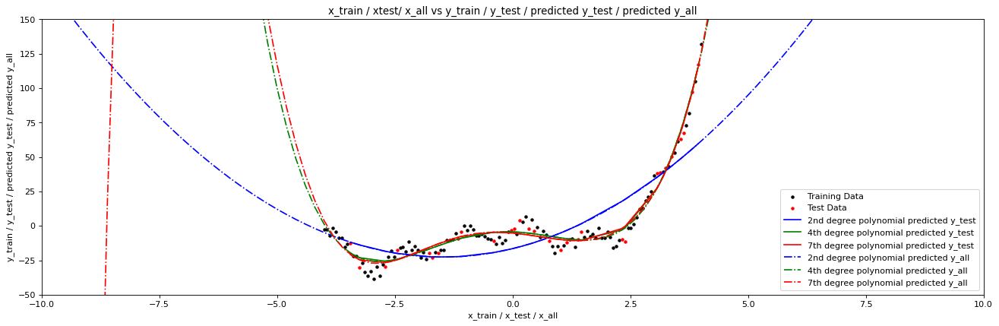

In [6]:
# Fit the different polynomials to the training data and make the plots 
train_rmses_100, test_rmses_100 = plot_curves(x_train, y_train, x_test, y_test)

**Note: The above graph has been limited to a certain range to clearly illustrate the differences in various plots**

## Part b

The model with the **4th degree polynomial** gives the best performance. 

If we look at the *2nd degree polynomial* predicted y vs x graphs of both *test* and *all* datasets we see no variation in the curvature of the graph despite the differences in the dataset. This is due to the presence of **high bias** in the model. This can also be observed from the high training MSE of this model.

If we look at the *7th degree polynomial* predicted y vs x graphs of both *test* and *all* datasets we see variation in the graphs of *all* dataset and *test* dataset. We see that the training dataset has x variables over the range **-4** to **4**. We do not have information in the training dataset about x values out of that range. In *all* dataset we have x variables which are out of the range so the model should ideally continue the signal direction that is observed in the training data due to **generalization**. But the *7th degree polynomial* varies the direction of the signal at around x = -7.5 which is probably due to noise. We can say that the *7th degree polynomial* has **high variance**. This can also be observed by looking and comparing the training and test MSEs with those of the *4th degree polynomial*. 

## Part c

#################### 20% data ####################
Polynomial of degree  2 

Training MSE:  161.17147378830037 

Test MSE:  402.3231269099294 



Polynomial of degree  4 

Training MSE:  35.11511313912979 

Test MSE:  38.340744983442896 



Polynomial of degree  7 

Training MSE:  22.543946691373304 

Test MSE:  135.20764526756543 





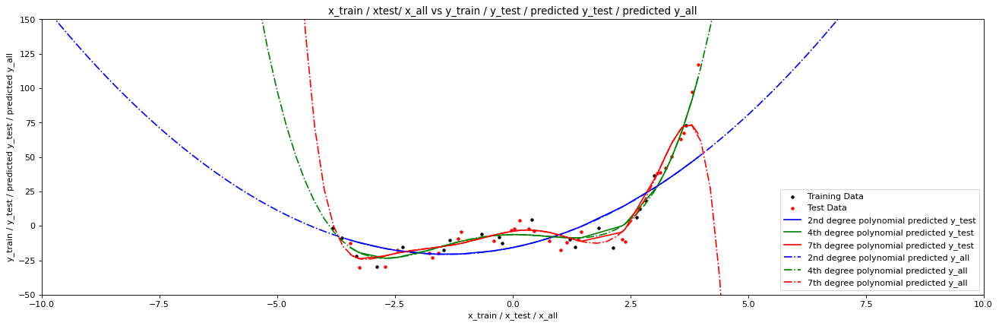

#################### 40% data ####################
Polynomial of degree  2 

Training MSE:  150.33251286085707 

Test MSE:  405.80516696165745 



Polynomial of degree  4 

Training MSE:  31.6245296464469 

Test MSE:  33.16428295918741 



Polynomial of degree  7 

Training MSE:  25.49271875165362 

Test MSE:  61.23741884551068 





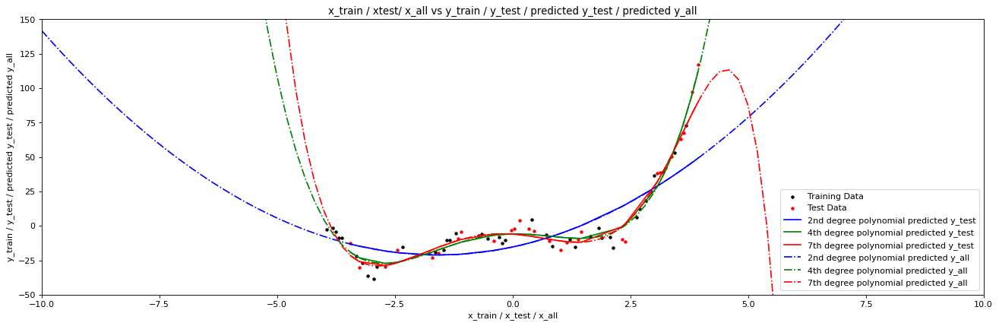

#################### 60% data ####################
Polynomial of degree  2 

Training MSE:  150.0838375914173 

Test MSE:  403.25137848334055 



Polynomial of degree  4 

Training MSE:  29.1928057399479 

Test MSE:  31.781415416196694 



Polynomial of degree  7 

Training MSE:  26.099088642454415 

Test MSE:  60.16667237664516 





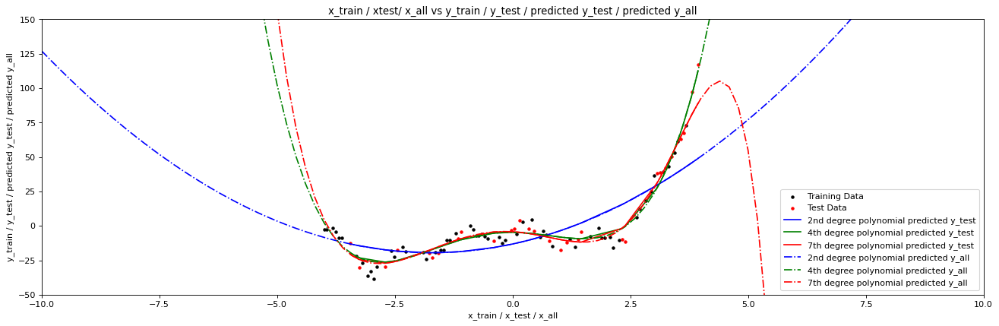

#################### 80% data ####################
Polynomial of degree  2 

Training MSE:  168.11882461502813 

Test MSE:  407.5936968818473 



Polynomial of degree  4 

Training MSE:  29.305108483323444 

Test MSE:  32.51810686874258 



Polynomial of degree  7 

Training MSE:  26.549129596283628 

Test MSE:  48.076935297106374 





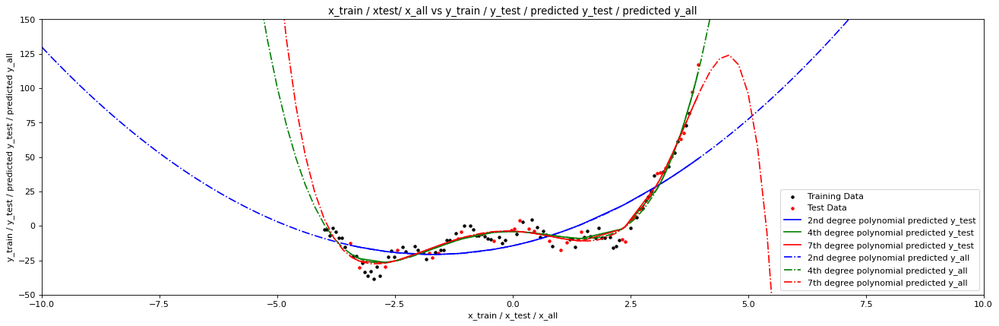

#################### 100% data ####################
Polynomial of degree  2 

Training MSE:  247.29679797371526 

Test MSE:  320.06408346977855 



Polynomial of degree  4 

Training MSE:  31.72001805729006 

Test MSE:  31.29208288660671 



Polynomial of degree  7 

Training MSE:  30.677193592109724 

Test MSE:  33.41069407769011 





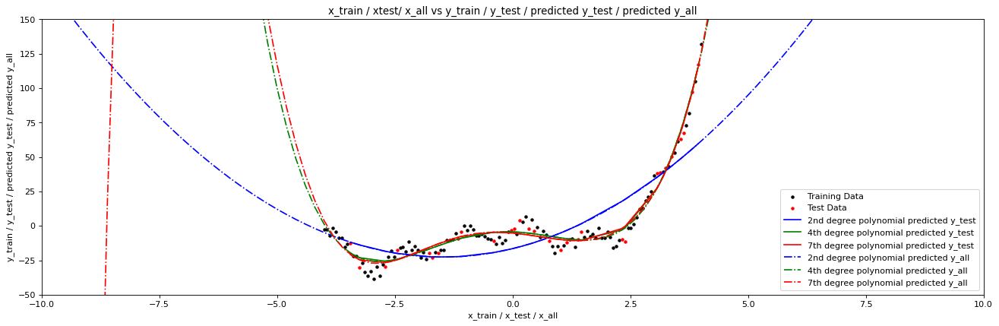

In [7]:
# Study the effects of the training data size on the bias and variance
print("#################### 20% data ####################")
train_rmses_20, test_rmses_20 = plot_curves(x_train[40:60], y_train[40:60], x_test, y_test)
print("#################### 40% data ####################")
train_rmses_40, test_rmses_40 = plot_curves(x_train[30:70], y_train[30:70], x_test, y_test)
print("#################### 60% data ####################")
train_rmses_60, test_rmses_60 = plot_curves(x_train[20:80], y_train[20:80], x_test, y_test)
print("#################### 80% data ####################")
train_rmses_80, test_rmses_80 = plot_curves(x_train[10:90], y_train[10:90], x_test, y_test)
print("#################### 100% data ####################")
train_rmses_100, test_rmses_100 = plot_curves(x_train, y_train, x_test, y_test)

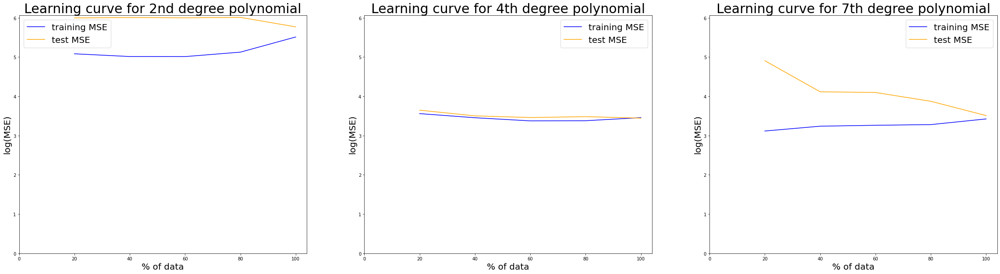

In [8]:
datasize_list = [20,40,60,80,100]

train_MSE_2 = []
train_MSE_4 = []
train_MSE_7 = []
test_MSE_2 = []
test_MSE_4 = []
test_MSE_7 = []

for items in datasize_list:
    train_MSE_2.append(log(eval('train_rmses_%d'% (items))[0]))
    train_MSE_4.append(log(eval('train_rmses_%d'% (items))[1]))
    train_MSE_7.append(log(eval('train_rmses_%d'% (items))[2]))
    test_MSE_2.append(log(eval('test_rmses_%d'% (items))[0]))
    test_MSE_4.append(log(eval('test_rmses_%d'% (items))[1]))
    test_MSE_7.append(log(eval('test_rmses_%d'% (items))[2]))

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1,
                                 ncols=3,
                                 sharey = True,
                                 figsize=(40, 10))

ax1.plot(datasize_list,train_MSE_2, label = 'Training MSE', color = "blue")
ax1.plot(datasize_list,test_MSE_2, label = 'Test MSE', color = "orange")
ax1.set_ylabel("log(MSE)", fontsize = 20)
ax1.set_xlabel("% of data", fontsize = 20)
ax1.set_ylim(ymin=0)
ax1.set_xlim(xmin=0)
ax1.legend(['training MSE','test MSE'], fontsize = 20)
ax1.set_title("Learning curve for 2nd degree polynomial", fontsize = 30)
    
ax2.plot(datasize_list,train_MSE_4, label = 'Training MSE', color = "blue")
ax2.plot(datasize_list,test_MSE_4, label = 'Test MSE', color = "orange")
ax2.set_ylabel("log(MSE)", fontsize = 20)
ax2.set_xlabel("% of data", fontsize = 20)
ax2.set_ylim(ymin=0)
ax2.set_xlim(xmin=0)
ax2.legend(['training MSE','test MSE'], fontsize = 20)
ax2.set_title("Learning curve for 4th degree polynomial", fontsize = 30)
ax2.yaxis.set_tick_params(labelbottom=True)

ax3.plot(datasize_list,train_MSE_7, label = 'Training MSE', color = "blue")
ax3.plot(datasize_list,test_MSE_7, label = 'Test MSE', color = "orange")
ax3.set_ylabel("log(MSE)", fontsize = 20)
ax3.set_xlabel("% of data", fontsize = 20)
ax3.set_ylim(ymin=0)
ax3.set_xlim(xmin=0)
ax3.legend(['training MSE','test MSE'], fontsize = 20)
ax3.set_title("Learning curve for 7th degree polynomial", fontsize = 30)
ax3.yaxis.set_tick_params(labelbottom=True)

plt.show()

With the varying training datasizes we can see that the **4th degree polynomial** has consistent training and test MSEs and also they are close in magnitude. For the *2nd degree polynomial* we see high training MSE and even higher test MSE which do converge but only at 100% training data. This shows the **bias** in the model. For the *7th degree polynomial* we see that it is data dependent and only converges to the minimum test MSE with increase in the training data size. This shows the **variance** in the model. We can also see this by comparing the graph of 7th degree polynomial *all* dataset when we are using **80%** and **100%** training data. We see that the *y_all* prediction for the *x_all* values of below **-7.5** and above **7.5** is completely reversed. For the *4th degree polynomial* we see consistency throughout the different training data sizes.

# Question 3: Stochastic Gradient Descent Improvements (10 pts)

1. (5 pts) Read this [blog](https://medium.com/optimization-algorithms-for-deep-neural-networks/gradient-descent-with-momentum-dce805cd8de8) on medium and describe in your own words how momentum leads to a faster convergence of the loss function. 

2. (5 pts) Read this [blog](https://sweta-nit.medium.com/batch-mini-batch-and-stochastic-gradient-descent-e9bc4cacd461) on medium and explain in your own words the advantages of Mini-batch Stochastic Gradient Descent. 


# Answer :

## Part 1

In a Stochastic Gradient Descent we select a sample randomly and calculate the gradients. After multiplying the gradient values with the learning factor we update our coefficients. In this process, as we are selecting random data points there is going to be a lot of noise. The path to the convergence will be filled with zig-zag pattern. To smoothen this path we use Stochastic Gradient Descent with momentum. Mathematically what we are doing is using the gradient values from the previous iterations in an exponentially weighted average methodology where the most recent gradient value gets the highest weight and as we move towards previous gradients the weights will reduce exponentially. The sum of all these weighted average gradient values will be multiplied with the learning factor and then will be used to update our coefficient for the next iteration. In summary, momentum decreases the oscillations where there are high oscillations and makes it faster to converge to the minima if the gradient is moving in the right direction.

## Part 2

Mini-batch Stochastic Gradient Descent can be thought of as a middle ground between Batch Gradient Descent where all the training data points are used in calculating the loss and then its gradient in each and every iteraction until convergence is reached and Stochastic Gradient Descent where only one randomly selected data point per iteration is used in loss calculation and then its gradient. In Mini-batch Stochastic Gradient Descent we randomly select a predetermined number of data points for the loss calculation. This method tackles the memory issues faced with Batch Gradient Descent where each data points loss needs to be stored for the loss summation at each iteration which leads to slower calcuations. This method also tackles the noisiness of the Stochastic Gradient Descent where one point is used for loss calculation which means high learning rate will lead to high oscillations making it difficult to reach the convergence.

# Question 4: Stochastic Gradient Descent (30 pts)

1.(**10 pts**) Stochastic gradient descent derivation<br>

Use stochastic gradient descent to derive the coefficent updates for the 4 coefficients $w_0, w_1, w_2, w_3$ in this model：

$$ y = w_0 + w_1e^{-x_1} + w_2 x_1 + w_3x_1x_2 $$ 


2.(**20 pts**) Stochastic gradient descent coding <br>

Code an SGD solution in Python for this non-linear model$$ y = w_0 + w_1e^{-x_1} + w_2x_1 + w_3x_1x_2 $$  The template of the solution class is given. The init function of the class takes as input the learning rate, regularization constant and number of epochs. The fit method must take as input X, y. The predict method takes an X value (optionally, an array of values). 

a) (**15 pts**) Use the expression derived in part 1 to predict the data given in 'SGD_samples.csv', for 15 epochs, using learning rates: [0, .0001, .001, .01, 0.1, 1, 10, 100] and regularization (ridge regression) constants: [0,10,100]. For the best 2 combinations of learning_rate and regularization for SGD, plot MSE and the $w$ parameters as a function of epoch (for 15 epochs) . 

b) (**5 pts**) Report the MSE of the two best combinations of learning rate and regularization constant.

# Answer

## Part 1

The above function can be written in the following format:
$$ y = \Sigma w_n\phi_n(\bar{x})$$  where $\phi_n(\bar{x})$ is any function in x space

The loss function given below is minimized by taking gradient on all the coefficients $w_n$ and using the gradient values after being multiplied by a learning factor($\eta$) in changing the coefficients 

$$ E = \frac{1}{2}(t - \Sigma w_n\phi_n(\bar{x}))^2$$

Lets partially differentiate the error function with a coefficient $w_1$

$$ \frac{\partial E}{\partial w_1} = -(t - \Sigma w_n\phi_n(\bar{x}))\phi_1(\bar{x})$$

Multiplying with the learning factor $\eta$ to the above gradient

$$- \eta(t - \Sigma w_n\phi_n(\bar{x}))\phi_1(\bar{x})$$

In the above expression, $(t - \Sigma w_n\phi_n(\bar{x}))$ is the error term which will be common across all the gradients and $\phi_1(\bar{x})$ is the coefficient update of the gradient w.r.t. the coefficient $w_1$

Hence, below are the coefficient updates of the coefficients of the equation:

$$ w_0 = 1 $$
$$ w_1 = e^{-x_1} $$
$$ w_2 = x_1 $$
$$ w_3 = x_1x_2 $$

By following the above concept we get the following coefficient updates:

$$ \eta\frac{\partial E}{\partial w_0} = -\eta(t - (w_0 + w_1e^{-x_1} + w_2 x_1 + w_3x_1x_2))$$
$$ \eta\frac{\partial E}{\partial w_1} = -\eta(t - (w_0 + w_1e^{-x_1} + w_2 x_1 + w_3x_1x_2))e^{-x_1}$$
$$ \eta\frac{\partial E}{\partial w_1} = -\eta(t - (w_0 + w_1e^{-x_1} + w_2 x_1 + w_3x_1x_2))x_1$$
$$ \eta\frac{\partial E}{\partial w_1} = -\eta(t - (w_0 + w_1e^{-x_1} + w_2 x_1 + w_3x_1x_2))x_1x_2$$

These updates are used to update the respective weights at each iteration:

$$w_0^{(\tau)} = w_0^{(\tau-1)} + \eta(t - (w_0 + w_1e^{-x_1} + w_2 x_1 + w_3x_1x_2))$$
$$w_1^{(\tau)} = w_1^{(\tau-1)} + \eta(t - (w_0 + w_1e^{-x_1} + w_2 x_1 + w_3x_1x_2))e^{-x_1}$$
$$w_2^{(\tau)} = w_2^{(\tau-1)} + \eta(t - (w_0 + w_1e^{-x_1} + w_2 x_1 + w_3x_1x_2))x_1$$
$$w_3^{(\tau)} = w_3^{(\tau-1)} + \eta(t - (w_0 + w_1e^{-x_1} + w_2 x_1 + w_3x_1x_2))x_1x_2$$

## Part 2

In [9]:
# Only use this code block if you are using Google Colab.
# If you are using Jupyter Notebook, please ignore this code block. You can directly upload the file to your Jupyter Notebook file systems.
#from google.colab import files

## It will prompt you to select a local file. Click on “Choose Files” then select and upload the file. 
## Wait for the file to be 100% uploaded. You should see the name of the file once Colab has uploaded it.
#uploaded = files.upload()

### Part a

In [10]:
%matplotlib inline
import random
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

class Regression:
    
    def __init__(self, learning_rate, regularization, n_epoch):
        self.learning_rate = learning_rate
        self.n_epoch = n_epoch
        self.regularization = regularization
        # initialize whichever variables you would need here
        self.coef = np.zeros(4)
#         self.coef[0] = 0.1
#         self.coef[1] = 0.1
#         self.coef[2] = 0.1
#         self.coef[3] = 0.1
        
    def sgd(self, gradient):
        #self.coef = self.coef -  self.learning_rate * gradient# = please put your codes here to update the self.coef using SGD
         self.coef = self.coef -  self.learning_rate * gradient
        
    def fit(self, X, y, update_rule='sgd', plot = True):
        mse = []
        coefs = []
        X = self.get_features(X)
        for epoch in range(self.n_epoch):
            for i in range(X.shape[0]):
                # Compute error
                   #please put your codes here
                error = y[i] - np.matmul(X[i], self.coef.transpose())
                

                # Compute gradients
                    #please put your codes here
                reg = np.zeros(4)
                reg[0] = 0
                reg[1:] = self.coef[1:]
                gradient = -1*(error * X[i] - self.regularization * reg)

                # Update weights
                self.sgd(gradient)

            coefs.append(self.coef)
            residuals = y - self.linearPredict(X)         
            mse.append(np.mean(residuals**2))

        self.lowest_mse = mse[-1]
        if plot == True:
            plt.figure()
            plt.plot(range(self.n_epoch),mse)
            plt.xlabel('epoch')
            plt.ylabel('MSE')
            plt.title('Learning Rate: ' + str(self.learning_rate) + ' & Regularization: ' + str(self.regularization)) 
            plt.figure()
            coefs = np.array(coefs)
            plt.plot(range(self.n_epoch),coefs[:,0],label='w0')
            plt.plot(range(self.n_epoch),coefs[:,1],label='w1')
            plt.plot(range(self.n_epoch),coefs[:,2],label='w2')
            plt.plot(range(self.n_epoch),coefs[:,3],label='w3')
            plt.legend()
            plt.xlabel('epoch')
            plt.ylabel('parameter value')
            plt.title('Learning Rate: ' + str(self.learning_rate) + ' & Regularization: ' + str(self.regularization))

    def get_features(self, X):
        '''
        this output of this function can be used to compute the gradient in `fit`
        '''
        x = np.zeros((X.shape[0], 4))
        x[:,0] = 1
        x[:,1] = X[:,0]
        x[:,2] = X[:,0]*X[:,1]
        x[:,3] = np.exp(-X[:,0])
        
        return x
        
    def linearPredict(self, X):
        return np.dot(X, self.coef) 
      #compute the dot product of self.coef and X
      #return None #this line is just a placeholder, please delete this line in your code        

In [11]:
import pandas as pd
data = pd.read_csv('SGD_samples.csv')
X = np.array([data['x1'].values, data['x2'].values]).T
y = data['y'].values
n_epochs = 15
learning_rate = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]
regularization = [0, 10, 100]

In [12]:
model_mse_dict = {}
for i in learning_rate:
    for j in regularization:
        model = Regression(learning_rate = i, regularization = j, n_epoch = n_epochs)
        model.fit(X, y, update_rule='sgd', plot=False)
        model_mse_dict[i,j] = model.lowest_mse
model_mse_dict

/var/folders/js/6m8rxh890b7fbhk2n4rb54dh0000gn/T/ipykernel_2407/2051381404.py:40: RuntimeWarning: overflow encountered in multiply
  gradient = -1*(error * X[i] - self.regularization * reg)
/var/folders/js/6m8rxh890b7fbhk2n4rb54dh0000gn/T/ipykernel_2407/2051381404.py:22: RuntimeWarning: invalid value encountered in subtract
  self.coef = self.coef -  self.learning_rate * gradient
/var/folders/js/6m8rxh890b7fbhk2n4rb54dh0000gn/T/ipykernel_2407/2051381404.py:47: RuntimeWarning: overflow encountered in square
  mse.append(np.mean(residuals**2))
/var/folders/js/6m8rxh890b7fbhk2n4rb54dh0000gn/T/ipykernel_2407/2051381404.py:32: RuntimeWarning: overflow encountered in matmul
  error = y[i] - np.matmul(X[i], self.coef.transpose())
/var/folders/js/6m8rxh890b7fbhk2n4rb54dh0000gn/T/ipykernel_2407/2051381404.py:40: RuntimeWarning: invalid value encountered in multiply
  gradient = -1*(error * X[i] - self.regularization * reg)
/var/folders/js/6m8rxh890b7fbhk2n4rb54dh0000gn/T/ipykernel_2407/20513814

{(0.0001, 0): 0.036820511797458454,
 (0.0001, 10): 0.04038192103561113,
 (0.0001, 100): 0.040671316719787215,
 (0.001, 0): 0.030495991520073523,
 (0.001, 10): 0.033705922493353295,
 (0.001, 100): 0.03379541078512453,
 (0.01, 0): 0.02739108757520101,
 (0.01, 10): 0.03382378526141906,
 (0.01, 100): 0.03381160036955282,
 (0.1, 0): 0.030987628014180486,
 (0.1, 10): 0.03455309387648329,
 (0.1, 100): nan,
 (1, 0): inf,
 (1, 10): nan,
 (1, 100): nan,
 (10, 0): nan,
 (10, 10): nan,
 (10, 100): nan,
 (100, 0): nan,
 (100, 10): nan,
 (100, 100): nan}

In [13]:
min_MSE_1 = min(model_mse_dict.values())
min_MSE_2 = max(model_mse_dict.values())
for v in model_mse_dict.values():
     if(v<min_MSE_2 and v>min_MSE_1):
            min_MSE_2 = v
best_MSE = [min_MSE_1, min_MSE_2]

keys_list = list(model_mse_dict.keys())
values_list = list(model_mse_dict.values())

for i in best_MSE:
    print(keys_list[values_list.index(i)])

(0.01, 0)
(0.001, 0)


The models with learning factors 0.01 and 0.001 and regularisation factor 0 have the lowest MSEs.

Note: Regularisation 0 is giving the best result as the other regularisation values are dominating the gradient component during the weight updation.

### Part b

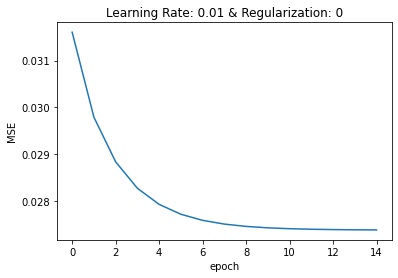

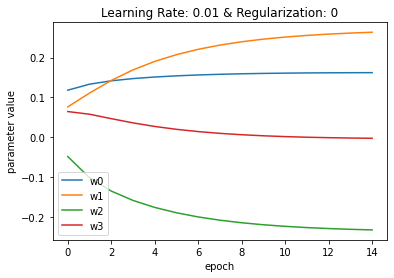

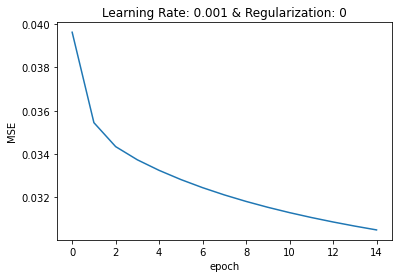

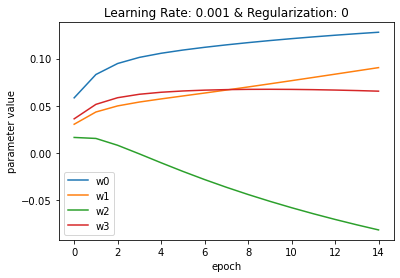

In [14]:
for i in best_MSE:
    model = Regression(learning_rate = keys_list[values_list.index(i)][0], regularization = keys_list[values_list.index(i)][1],\
                       n_epoch = n_epochs)
    model.fit(X, y, update_rule='sgd', plot=True)